## Project 5 - Outage Prediction using weather radar data


---

***Notebook Overview***


In this notebook, I will construct:

### Visualize the power grid and outages with Folium

- Collect information of power grid from OpenStreetMap Data
    - Step 1 : Go to https://export.hotosm.org/en/v3/
    - Step 2 : Start exporting
    - Step 3 : Select area you want to ectract data, ddd name, select format file( *shp), choose 'power' in data tab
    - Step 4 : Create export



- Extract the outage locations from Central Hudson dataset

- Plot the outages and transmission power grid topology in this area


### Visualize the outages during the weather with Py-Art

- Extract the number of outages in 2-hour window of radar weather

- Create animated image 



### To install the dependencies:

`
conda install -c conda-forge folium 
conda install -c conda-forge arm_pyart
conda install basemap
`

# Load library

In [1]:
print(__doc__)

import os
from os import chdir
import urllib.request
import json
import glob
from time import sleep
import datetime
import tempfile

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import folium
import folium.plugins as plugins
from folium.plugins import MarkerCluster, FastMarkerCluster, HeatMap
from folium import IFrame, Map, Marker, GeoJson, LayerControl

import cartopy
from netCDF4 import num2date
import pyart
import pytz

%matplotlib inline

Automatically created module for IPython interactive environment

## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



# Helper functions

In [2]:
# check if lat/lon is valid 
def validate_lat_lon(lat, lon, lat_median, lon_median):
    if lat >= -90 and lat <= 90 and lon >= -180 and lon <= 180 and \
    abs(lat-lat_median < 10) and abs(lon-lon_median < 10):
        return 'Valid'
    else:
        return 'Invalid'

In [3]:
def extract_datetime(cfradial):
    
    date = cfradial.split('/')[-1].split('.')[0][4:]
    date = date[1:5] + '-'+ date[5:7] + '-' + date[7:9] + ' ' + date[10:12] + ':' + date[12:] + ':00'
    
    return datetime.datetime.strptime(date, '%Y-%m-%d  %H:%M:%S')

# Visualize the power grid and outages with Folium

In [4]:
df_outage = pd.read_pickle('./data/caidi.pkl')

# check valid lat and lon
lat_median = np.median(df_outage['LATITUDE'])
lon_median = np.median(df_outage['LONGITUDE'])

df_outage['validLatLon'] = df_outage.apply(lambda x : validate_lat_lon(x['LATITUDE'], x['LONGITUDE'], \
                                                                     lat_median, lon_median), axis=1)

# remove invalid lat and lon
df_outage = df_outage[df_outage['validLatLon'] == 'Valid']
print(f'Dimension of data frame {df_outage.shape}')

Dimension of data frame (32142, 37)


In [5]:
## read grid file (*shp) 

In [6]:
shapefile = gpd.read_file('./data/new_york_state_shp/new_york_state_planet_osm_point_points.shp')
#print(shapefile)
#print(shapefile['geometry'])

lats_lons = [(point.y, point.x) for point in shapefile['geometry']]
print(len(lats_lons))

lats , lons = list(zip(*lats_lons))
df_grid_topology = pd.DataFrame({'lat' : lats, 'lon' : lons})
df_grid_topology.to_csv('./data/hudson_power_grid.csv')

15729


In [7]:
import pylab as plot
params = {'legend.fontsize': 18,
          'legend.handlelength': 2}
plot.rcParams.update(params)

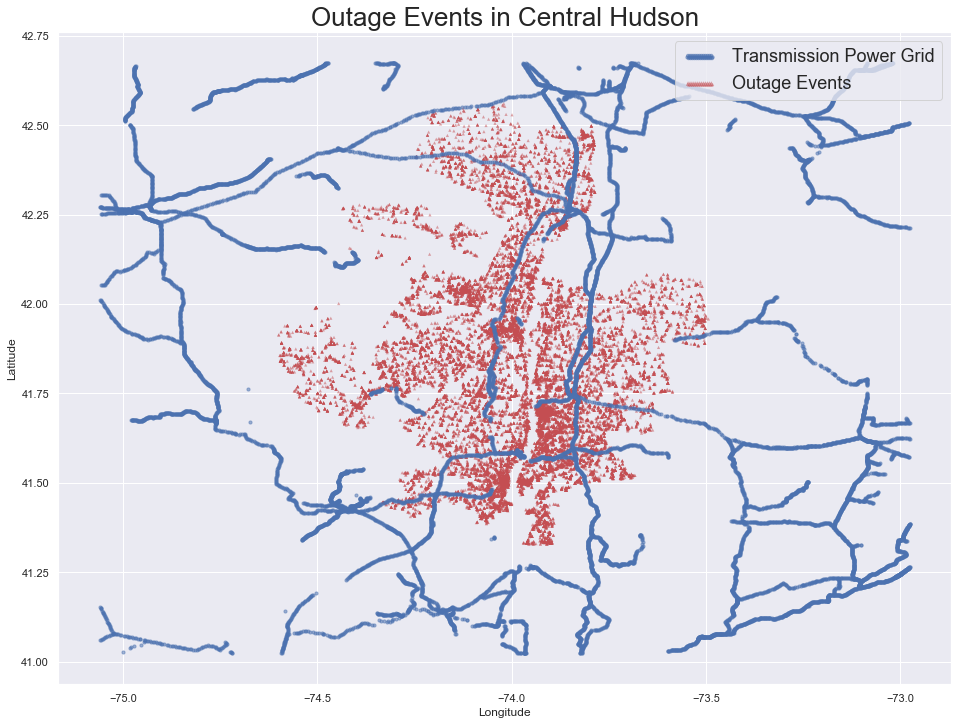

In [8]:
# show a map of the worldwide data points
fig, ax = plt.subplots(figsize=[16, 12])

rs_scatter = ax.scatter(df_outage['LONGITUDE'], df_outage['LATITUDE'], c='r', edgecolor='None', alpha=0.5, s=10, marker="^")

df_scatter = ax.scatter(df_grid_topology['lon'], df_grid_topology['lat'], c='b', alpha=0.5, s=10)

ax.set_title('Outage Events in Central Hudson', size=26)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend([df_scatter, rs_scatter ], ['Transmission Power Grid', 'Outage Events', ], loc='upper right', scatterpoints = 40)
plt.show()

# Visualize the power grid topology with Folium (Optional)

It takes up a lot of memory to run this !!!

## Using lat/lon location list

## Using *shp files

We need to know the Coordinate Reference System (CRS) of the data. That information is stored in the .crs property and we can use pyepsg to get more information about it.

In [18]:
import pyepsg
import geopandas

path = './data/new_york_state_shp/{}'.format
ny = geopandas.GeoDataFrame.from_file(path('new_york_state_planet_osm_point_points.shp'))

pyepsg.get(ny.crs['init'].split(':')[1])

gjson = ny.to_crs(epsg='4326').to_json()

# Visualizing the outages and weather radar with Py-Art

In [9]:
# collect all files with extension .cfradial
cfradials = glob.glob('/Users/ducvu/Documents/Argonne_Analyitcs/nexrad_dataset/KENX/*2011082*.cfradial')

# create dataframe of cfradial files
df_cfradial = pd.DataFrame({'cfradial' : cfradials })

# extract radar datetime when each cfradial file was collected
df_cfradial['datetime'] = df_cfradial['cfradial'].apply(lambda cfradial : extract_datetime(cfradial))

In [10]:
# create dataframe of outage events with its lat/lon and time the event was reported
df_outage = df_outage[['LATITUDE', 'LONGITUDE', 'Receive Datetime']]


# define time margin of less than 2 hours (i.e 119 minutes) 
margin = datetime.timedelta(minutes = 119) 


# if the event occurred between radar datetime and radar datetime plus margin, 
# we assigned the radar datetime( i.e cfradial file) to that event 
result = []
for _, row_x in df_outage.iterrows():
    for _, row_y in df_cfradial.iterrows():
        if (row_y['datetime'] <= row_x['Receive Datetime'] <= row_y['datetime'] + margin):
            result.append((row_x['LATITUDE'], row_x['LONGITUDE'], row_y['cfradial']))
            
            
            
# create dataframe for radar files and locations
lats, lons, cfradial = list(zip(*result))
df = pd.DataFrame({'lat':lats, 'lon':lons, 'cfradial':cfradial})
df['lat_lon'] = list(zip(df['lat'], df['lon']))

In [11]:
def plot_radar(cfradial_file, points):
    '''
    This function will plot the radar reflectivity from cfradial files
    and the total electrical failures over a period of every 2 hours
    Input :
        cfradial_file : radar file
        points : list of lat/lon where the outage occurred
        
    
    Output : 
        *radar.png :  visualization will be stored in folder ./image
    '''
    
    radar = pyart.io.read_cfradial(cfradial_file)

    suffix = cfradial_file.split('/')[-1].split('.')[0][4:]
    suffix_title = suffix[1:5] + '-'+ suffix[5:7] + '-' + suffix[7:9] + ' ' + suffix[10:12] + ':' + suffix[12:] + ':00'
    
    
    #Lets get some geographical context
    lats = radar.gate_latitude
    lons = radar.gate_longitude

    zoom = 2
    min_lon = lons['data'].min() + zoom
    min_lat = lats['data'].min() + zoom
    max_lat = lats['data'].max() - zoom
    max_lon = lons['data'].max() - zoom-1

    ############################################################
    fig = plt.figure(figsize = [20,16])
    display = pyart.graph.RadarMapDisplayCartopy(radar)
    lat_0 = display.loc[0]
    lon_0 = display.loc[1]

    # Main difference! Cartopy forces you to select a projection first!
    projection = cartopy.crs.Mercator(
                    central_longitude=lon_0,
                    min_latitude=min_lat, max_latitude=max_lat)

    #title = 'KENX Radar Reflectivity at ' + suffix_title +'\n' 
    title = ''
    
    display.plot_ppi_map(
        'reflectivity', 0, colorbar_flag=True,
        title=title,
        projection=projection,
        min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat,
        vmin=12, vmax=64)

    # Mark the radar
    display.plot_point(lon_0, lat_0, symbol='^r', MarkerEdgeColor='w', MarkerSize=10)
    display.plot_point(-122.4194, 37.7749, symbol='ob', MarkerEdgeColor='w', MarkerSize=10)
    display.plot_point(-118.2437, 34.0522, symbol='ob', MarkerEdgeColor='w', MarkerSize=10)

    # plot outages
    for s in points:
        display.plot_point(s[1], s[0], symbol='^r', MarkerEdgeColor='w', MarkerSize=25)
        
      
    plt.savefig('./image/' + suffix + 'radar.png')
    #plt.show()

/Users/ducvu/anaconda3/envs/map-gen/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/ducvu/anaconda3/envs/map-gen/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/Users/ducvu/anaconda3/envs/map-gen/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.

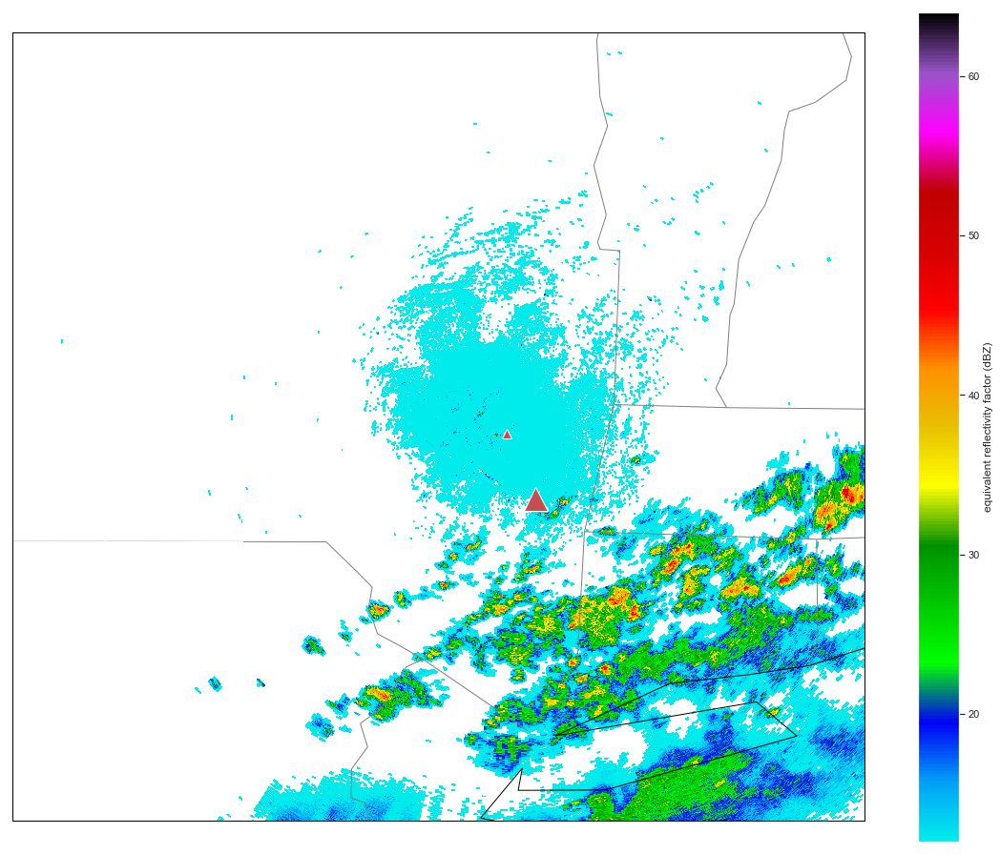

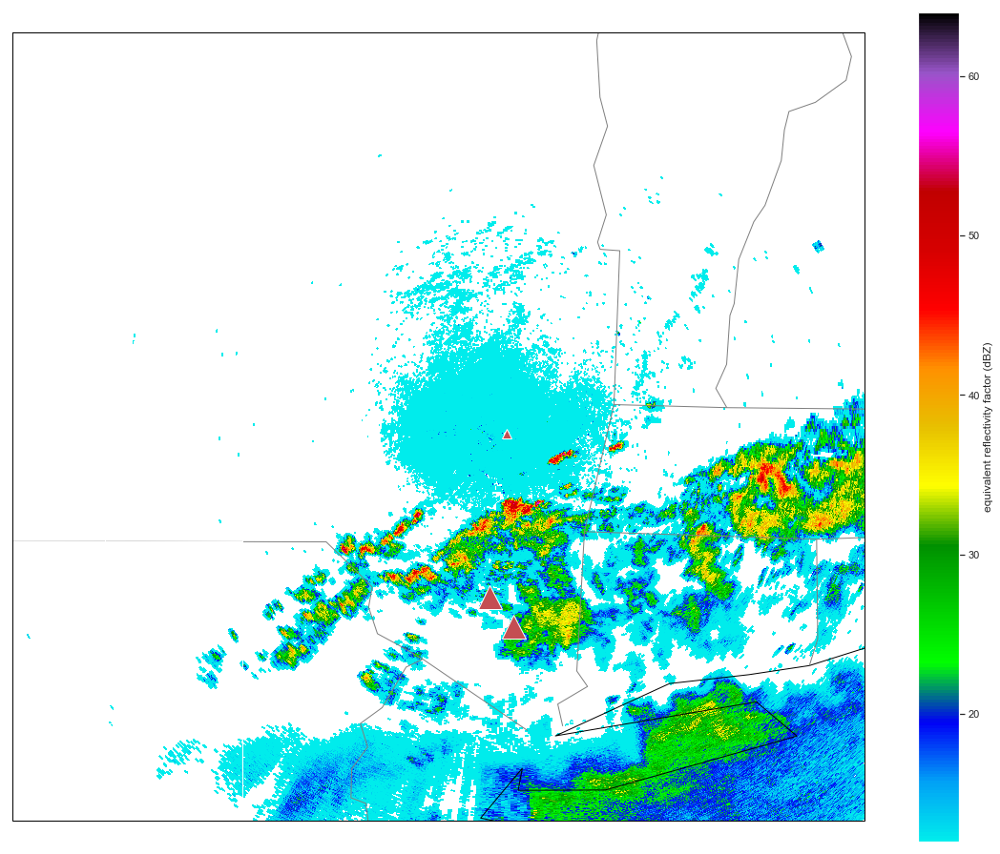

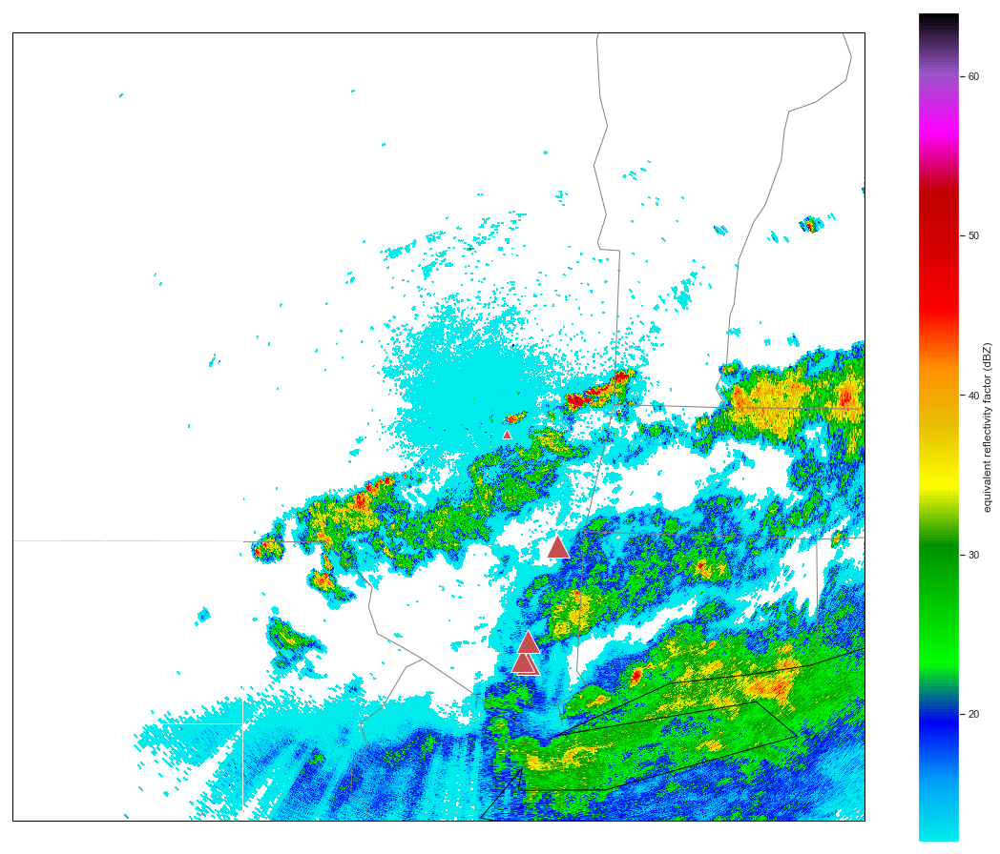

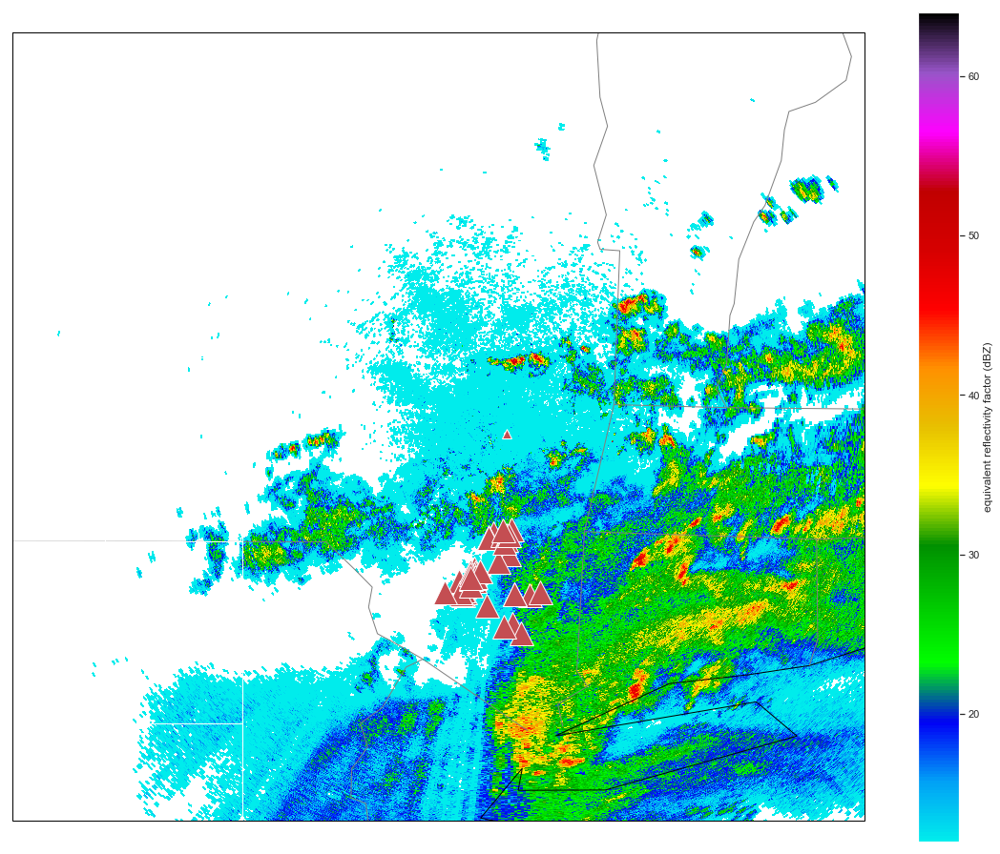

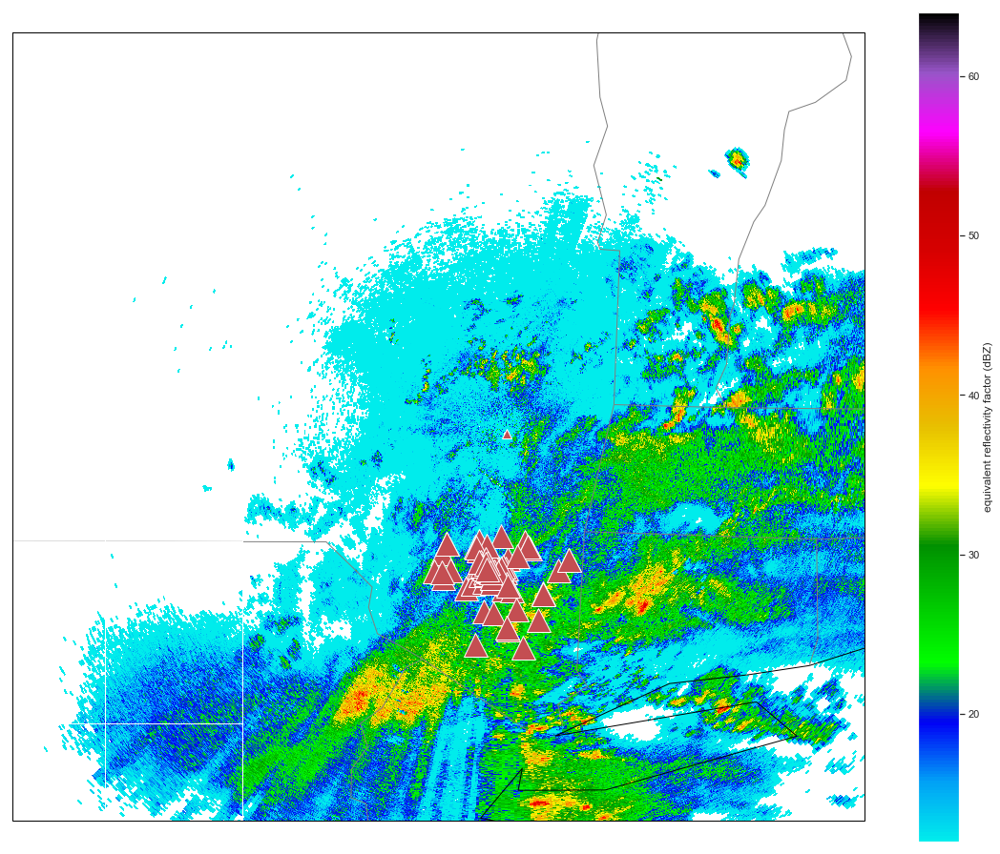

...

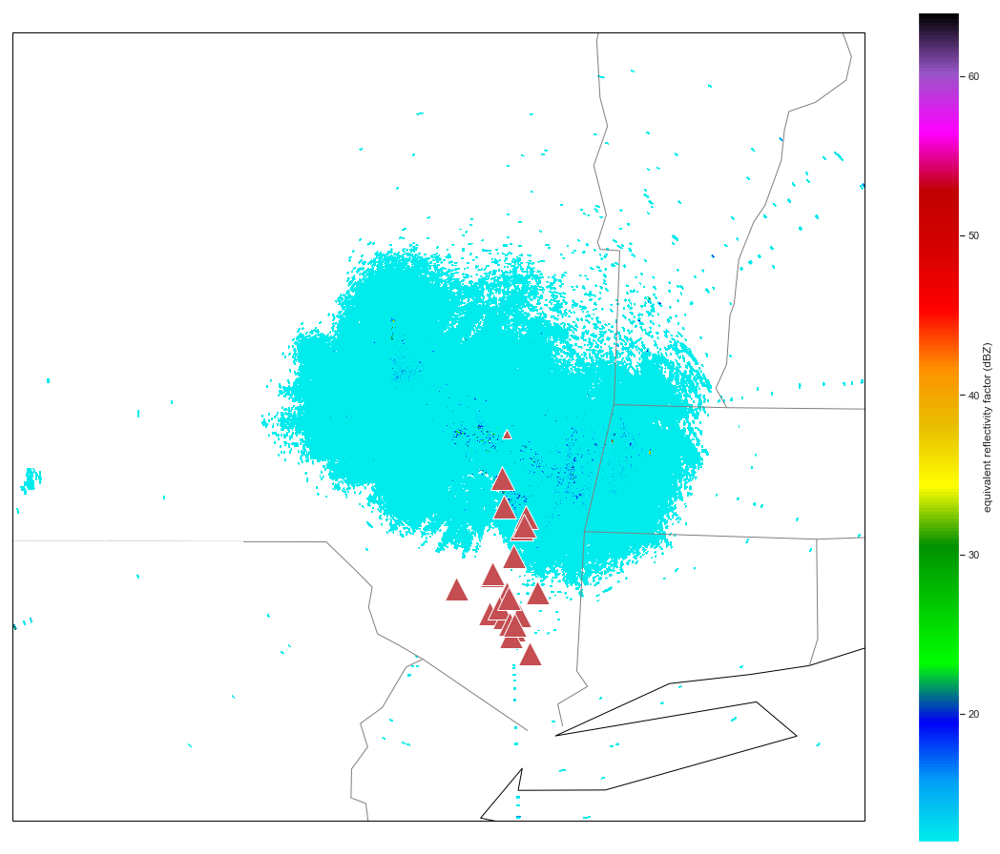

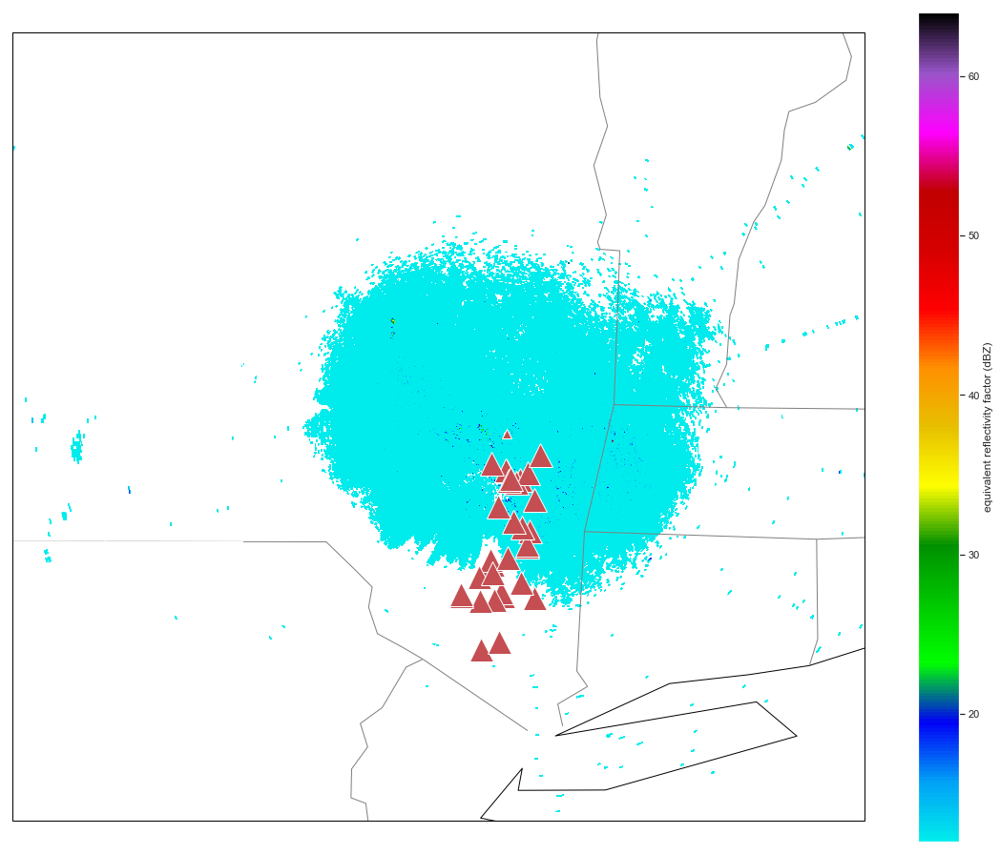

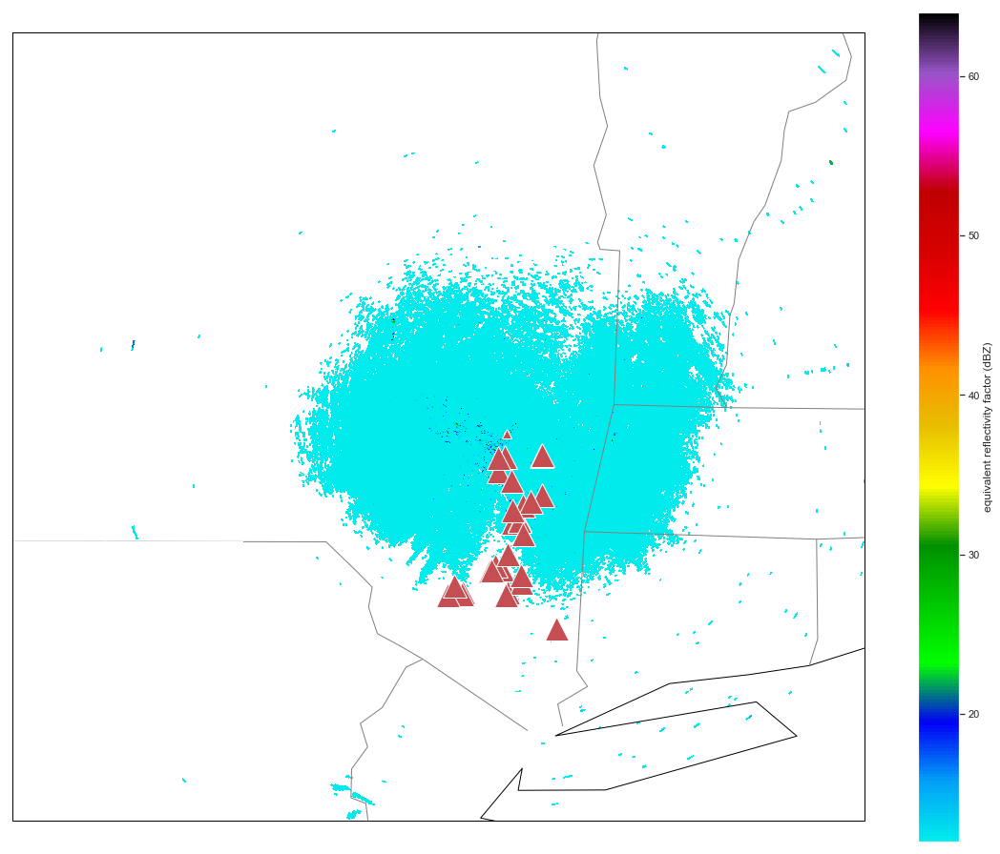

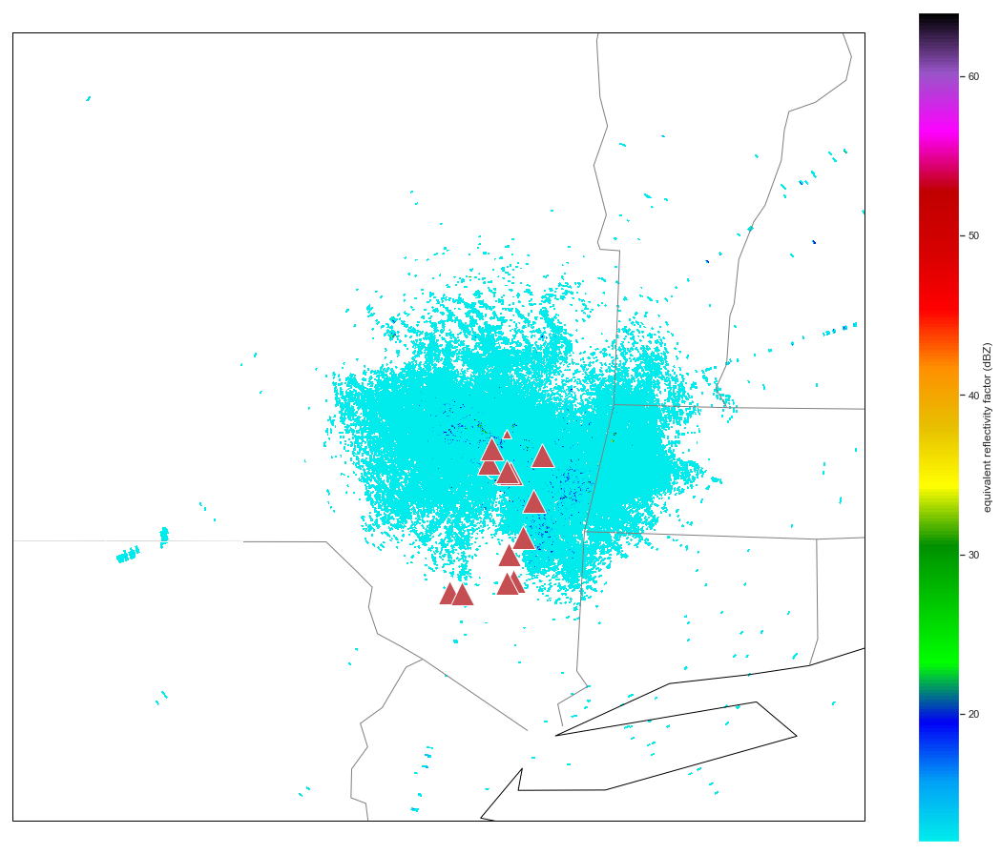

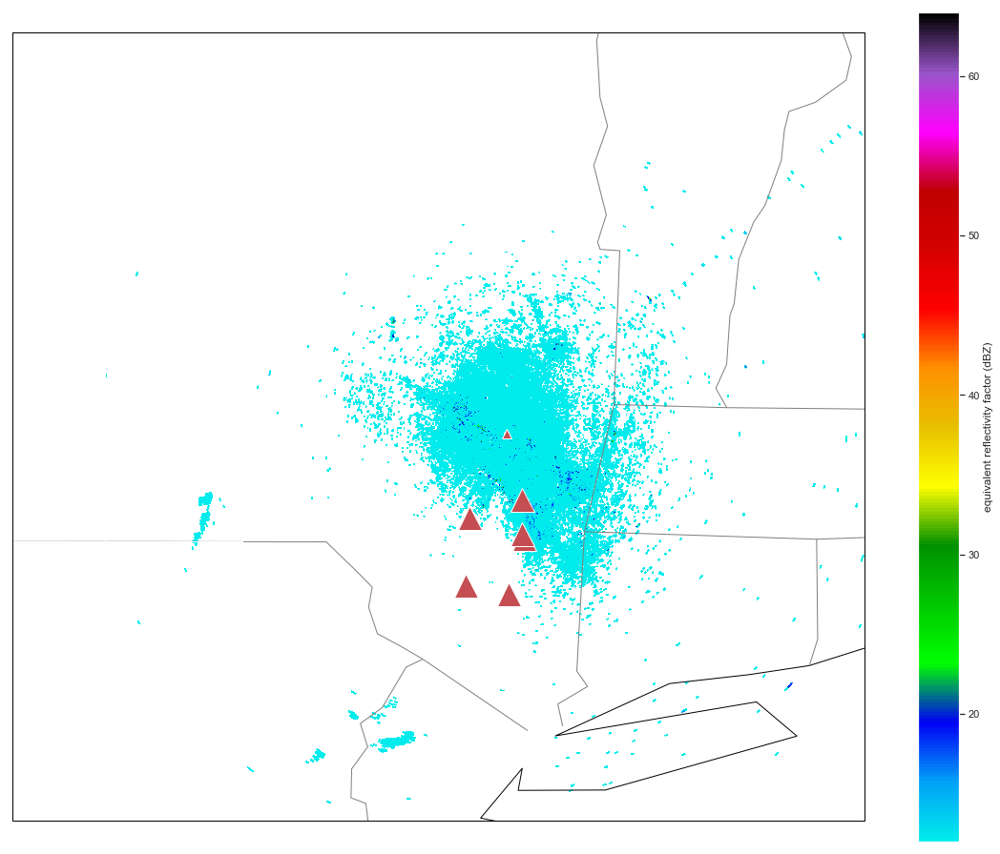

In [12]:
# collect all locations with the same cfradial files and 
# convert it into dictionary where key is radar file and value is list of points
dic_outage = df.groupby(['cfradial'])['lat_lon'].apply(list).to_dict()
#dic = {k: list(v) for k, v in df_outage.groupby(['cfradial'])['lat_lon']}


# visualize the result
for cfradial_file, points in dic_outage.items():
    plot_radar(cfradial_file, points)

## Create animated image

In [13]:
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw 

def update_image(filename):
    '''
    This function will change the font and add new text in each image   
    '''
    suffix = filename.split('/')[-1].split('.')[0][:-5]
    suffix_title = suffix[1:5] + '-'+ suffix[5:7] + '-' + suffix[7:9] + ' ' + suffix[10:12] + ':' + suffix[12:] + ':00'

    name = filename.split('/')[-1].split('.')[0]
    
    img = Image.open(filename)
    draw = ImageDraw.Draw(img)
    font = ImageFont.truetype('./data/DejaVuSans.ttf', size = 50,encoding="unic")


    draw.text((420, 180),suffix_title ,(0,0,0), font=font)
    
    del draw
    img.save('./image/' + name + '-update.png')
    #return img
    

In [14]:
import imageio

# generate the updated images
filenames = sorted(glob.glob('./image/d*radar.png')) 

for filename in filenames:
    update_image(filename)

    
# generate animation image
filenames = sorted(glob.glob('./image/d*radar-update.png'))

    
images = []

for filename in filenames:
    images.append(imageio.imread(filename))


imageio.mimsave('./image/radar.gif', images, duration=1.2)

In [ ]:
#<img src='./image/radar.gif'>

# Reference

Export power line from OSM : 

- https://export.hotosm.org/en/v3/exports/new/describe


read .shp in python

- https://ocefpaf.github.io/python4oceanographers/blog/2015/12/14/geopandas_folium/


read .shp file :

 - https://mapshaper.org
 


power grid ny

- https://www.flosm.de/en/powergrid.html?lat=41.2020517&lon=-73.8958432&r=79303.574&st=0&sw=cabledistributioncabinet,powerbay,powerbusbar,powercable,powercompensator,powerconverter,powerline,powerline110k,powerline115k,powerline20k,powerline220k,powerline220v,powerline225k,powerline30k,powerline380k,powerline3k,powerline400k,powerline420k,powerline500v,powerline50k,powerline6k,powerline750k,powerline765k,powerlinedchigh,powerlinedclow,powerpole,powersubstation,powerswitch,powertower,transformer